Find cells belonging to different clusters in the same field of view. Draw contour of cells.

In [1]:
from tifffile import imread
from skimage.measure import find_contours, regionprops
from matplotlib import pyplot as plt
import seaborn as sns
import os, sys
from starmap.sequencing import *
import numpy as np
import pandas as pd
from tqdm import tqdm

In [2]:
ppath = '/stanley/WangLab/Data/Processed/2022-09-30-Rena-Cardiomyocyte64Gene'
# ppath = 'Z:/Data/Processed/2022-09-30-Rena-Cardiomyocyte64Gene'

In [3]:
def load_reads_3D(fpath, reads_file):
    S = loadmat(os.path.join(fpath, reads_file))
    bases = [str(i[0][0]) for i in S["merged_reads"]]
    points = S["merged_points"]
    temp = np.zeros(points.shape)
    temp[:, 0] = np.round(points[:, 2]-1)
    temp[:, 1] = np.round(points[:, 1]-1)
    temp[:, 2] = np.round(points[:, 0]-1)

    print(f"Number of reads: {len(bases)}")
    return bases, temp

In [39]:
area_list = list(range(1,7))
area2sample = {
    1: 'STARmap',
    2: '2h_labeling_6h_wash', 
    3: '2h_labeling_4h_wash',
    4: '20h_labeling',
    5: '2h_labeling',
    6: '2h_labeling_2h_wash'
}

In [4]:
# reads -> project to 2D
genes2seqs, seqs2genes = load_genes(ppath)
mat_bases, mat_points = load_reads_3D(os.path.join(ppath, 'output', '2022-10-15-merged-points', f'Area_1'), 'merged_goodPoints.mat')
points = mat_points.astype(int)
bases = np.array([seqs2genes[x] for x in mat_bases])

Number of reads: 3263111


In [5]:
# segmentation
cell_seg = imread(os.path.join(ppath, 'output', '2022-10-16-2D-segmentation', 'flamingo_backscaled', 'Area1_cell_2D.tif'))
nucl_seg = imread(os.path.join(ppath, 'output', '2022-10-16-2D-segmentation', 'dapi_backscaled', 'Area1_nuclei_2D.tif'))

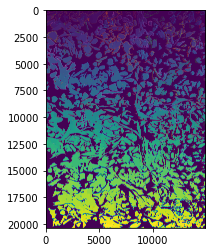

In [53]:
# draw contour
contour = find_contours(cell_seg>0)
plt.imshow(cell_seg)
for ct in contour:
    plt.plot(ct[:,1], ct[:,0], linewidth=0.1)
# NOTE cannot simply use find_contour on binary -- cells clumped together contour will not separate -> need to obtain contour one by one

In [7]:
# add cell label
cell_type = pd.read_csv('/stanley/WangLab/Connie/02.TEMPOmap/02.revisionCardiomyocyte64Gene/Nov10_cardiac_cluster_label.csv')
cell_type

,Unnamed: 0,orig_index,sample,area,x,y,z,nuclues_volume,AF546,AF546_nucleus,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,volume,n_volume,nCount_RNA,nFeature_RNA,RNA_snn_res.0.1,seurat_clusters
0,1051,0,2h_labeling_6h_wash,505671,96,12726,17,295630,2,1,22,3.135494,105,4.663439,505671,295630,105,22,0,0
1,1052,1,2h_labeling_6h_wash,307387,54,7831,17,101313,0,0,18,2.944439,77,4.356709,307387,101313,77,18,0,0
2,1053,2,2h_labeling_6h_wash,133770,50,8461,15,91892,1,1,10,2.397895,17,2.890372,133770,91892,17,10,1,1
3,1054,3,2h_labeling_6h_wash,617687,133,1382,16,125781,5,0,25,3.258097,55,4.025352,617687,125781,55,25,1,1
4,1055,4,2h_labeling_6h_wash,275230,75,14348,14,89334,0,0,12,2.564949,52,3.970292,275230,89334,52,12,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8466,9624,1384,2h_labeling_2h_wash,658458,20239,7082,14,233127,1,0,24,3.218876,170,5.141664,658458,233127,170,24,0,0
8467,9625,1385,2h_labeling_2h_wash,318836,20220,9478,9,128602,2,2,27,3.332205,98,4.595120,318836,128602,98,27,0,0
8468,9626,1386,2h_labeling_2h_wash,639378,20277,11077,12,127610,0,0,31,3.465736,142,4.962845,639378,127610,142,31,0,0
8469,9627,1387,2h_labeling_2h_wash,345181,20281,12452,11,142509,2,0,37,3.637586,138,4.934474,345181,142509,138,37,0,0


In [45]:
np.unique(cell_type['sample'])

array(['20h_labeling', '2h_labeling', '2h_labeling_2h_wash',
       '2h_labeling_4h_wash', '2h_labeling_6h_wash'], dtype=object)

In [12]:
# draw cell-type resolved contour
cardiac = cell_type[cell_type['seurat_clusters']==0]['orig_index']+1
fibroblast = cell_type[cell_type['seurat_clusters']==1]['orig_index']+1

In [9]:
# contour_cardiac = [find_contours(cell_seg==i) for i in cardiac]
# contour_cardiac

In [32]:
a = 10000
cell_seg_ = cell_seg[:a, :a]
nucl_seg_ = nucl_seg[:a,:a]

In [33]:
contour_cardiac_cell = []
contour_cardiac_nucl = []
for i in tqdm(cardiac[:500]):
    ct_cell = find_contours(cell_seg_==i)
    ct_nucl = find_contours(nucl_seg_==i)
    if len(ct_cell):
        contour_cardiac_cell.append(ct_cell[0])
        contour_cardiac_nucl.append(ct_nucl[0]) 

100%|██████████| 500/500 [07:25<00:00,  1.12it/s]


In [34]:
contour_fibroblast_cell = []
contour_fibroblast_nucl = []
for i in tqdm(fibroblast[:500]):
    ct_cell = find_contours(cell_seg_==i)
    ct_nucl = find_contours(nucl_seg_==i)
    if len(ct_cell):
        contour_fibroblast_cell.append(ct_cell[0])
        contour_fibroblast_nucl.append(ct_nucl[0])

100%|██████████| 500/500 [07:31<00:00,  1.11it/s]


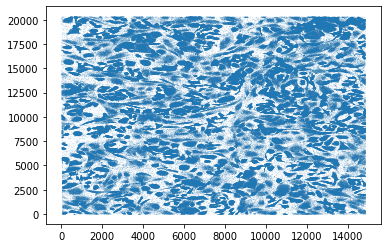

In [25]:
# 2D project points
plt.scatter(points[:,2], points[:,1], s=0.0001)

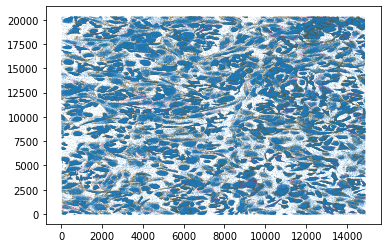

In [30]:
plt.scatter(points[:,2], points[:,1], s=0.0001)
for ct_cardiac in contour_cardiac:
    plt.plot(ct_cardiac[:,1], ct_cardiac[:,0], linewidth=0.1, c='red')
for ct_fibroblast in contour_fibroblast:
    plt.plot(ct_fibroblast[:,1], ct_fibroblast[:,0], linewidth=0.1, c='green')
# plt.savefig('/stanley/WangLab/Connie/02.TEMPOmap/02.revisionCardiomyocyte64Gene/output/figures/cell_contour.pdf')
# NOTE very large

In [37]:
points_ = points[np.logical_and(points[:,1]<a, points[:,2]<a)]

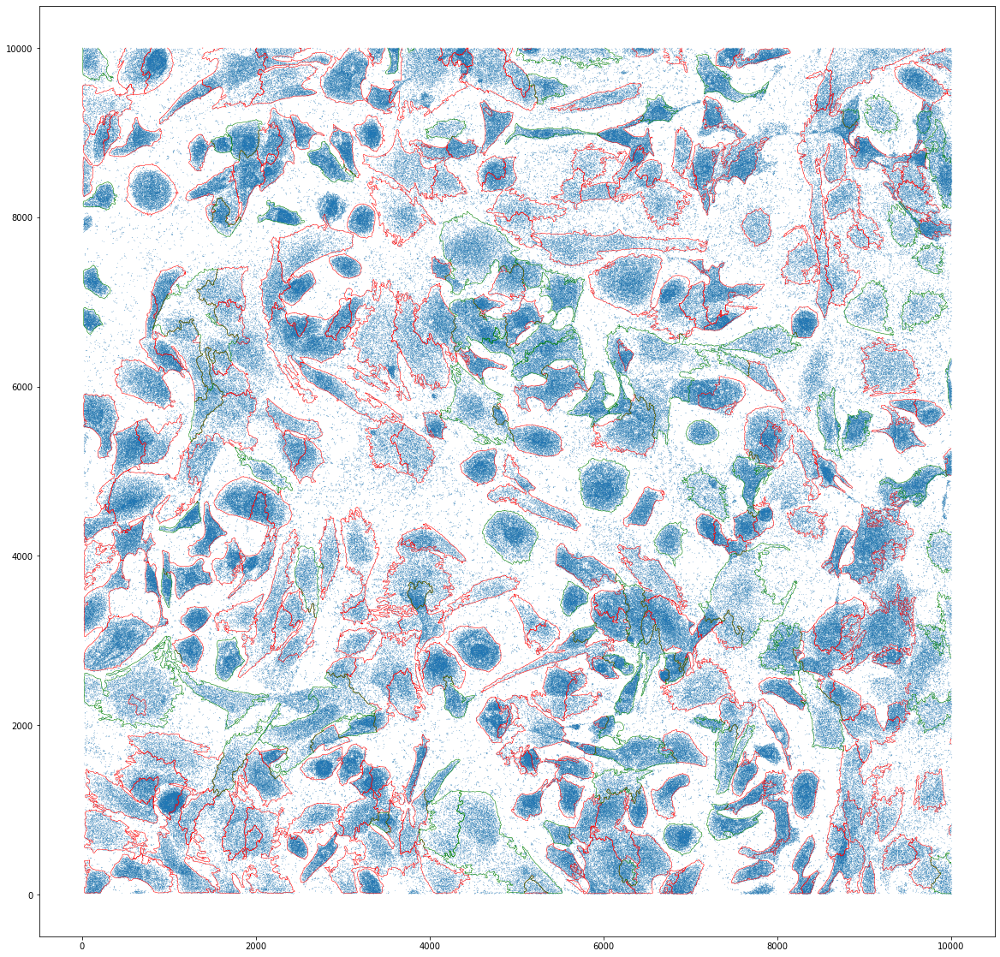

In [38]:
plt.figure(figsize=(20,20))
plt.scatter(points_[:,2], points_[:,1], s=0.01)
for ct_cardiac in contour_cardiac:
    plt.plot(ct_cardiac[:,1], ct_cardiac[:,0], linewidth=0.5, c='red')
for ct_fibroblast in contour_fibroblast:
    plt.plot(ct_fibroblast[:,1], ct_fibroblast[:,0], linewidth=0.5, c='green')
# plt.savefig('/stanley/WangLab/Connie/02.TEMPOmap/02.revisionCardiomyocyte64Gene/output/figures/cell_contour.pdf')

Number of reads: 406506


100%|██████████| 500/500 [10:59<00:00,  1.32s/it]


Number of reads: 447187


100%|██████████| 500/500 [11:01<00:00,  1.32s/it]


Number of reads: 1069538


100%|██████████| 500/500 [11:01<00:00,  1.32s/it]


Number of reads: 581366


100%|██████████| 500/500 [10:56<00:00,  1.31s/it]


Number of reads: 450801


100%|██████████| 453/453 [09:54<00:00,  1.31s/it]


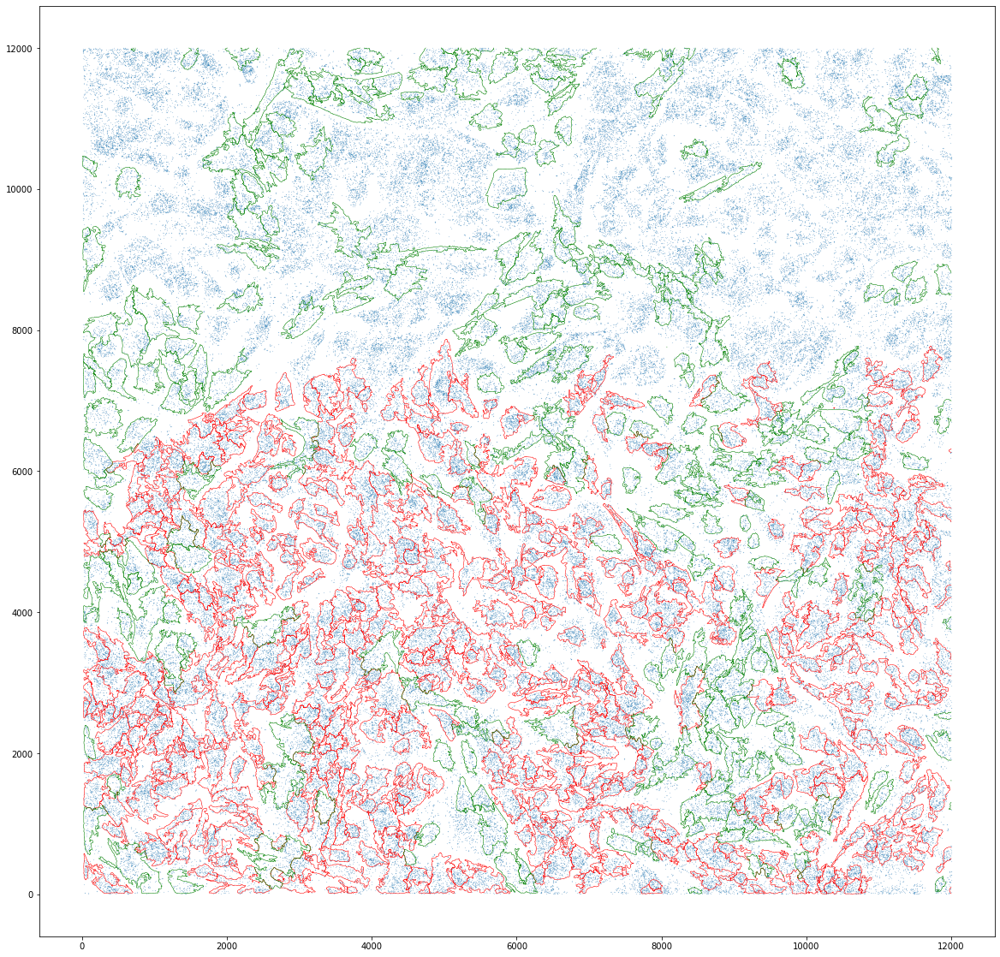

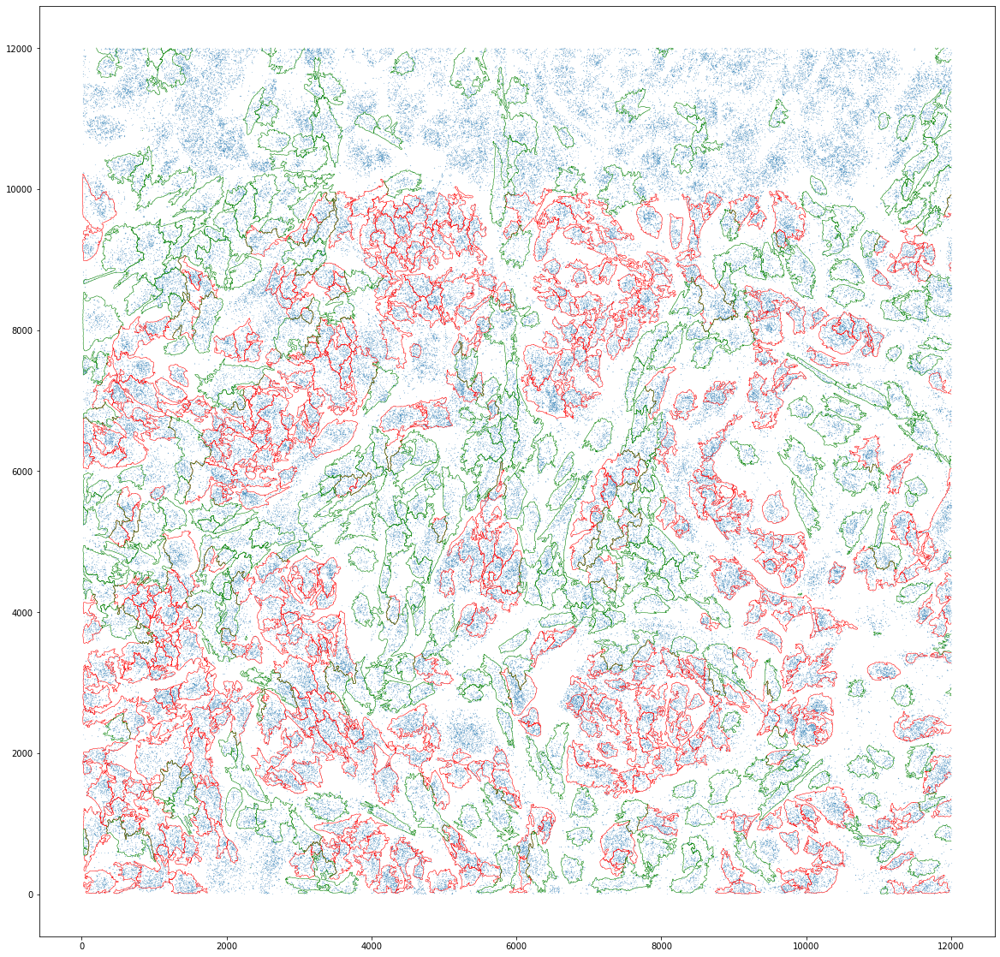

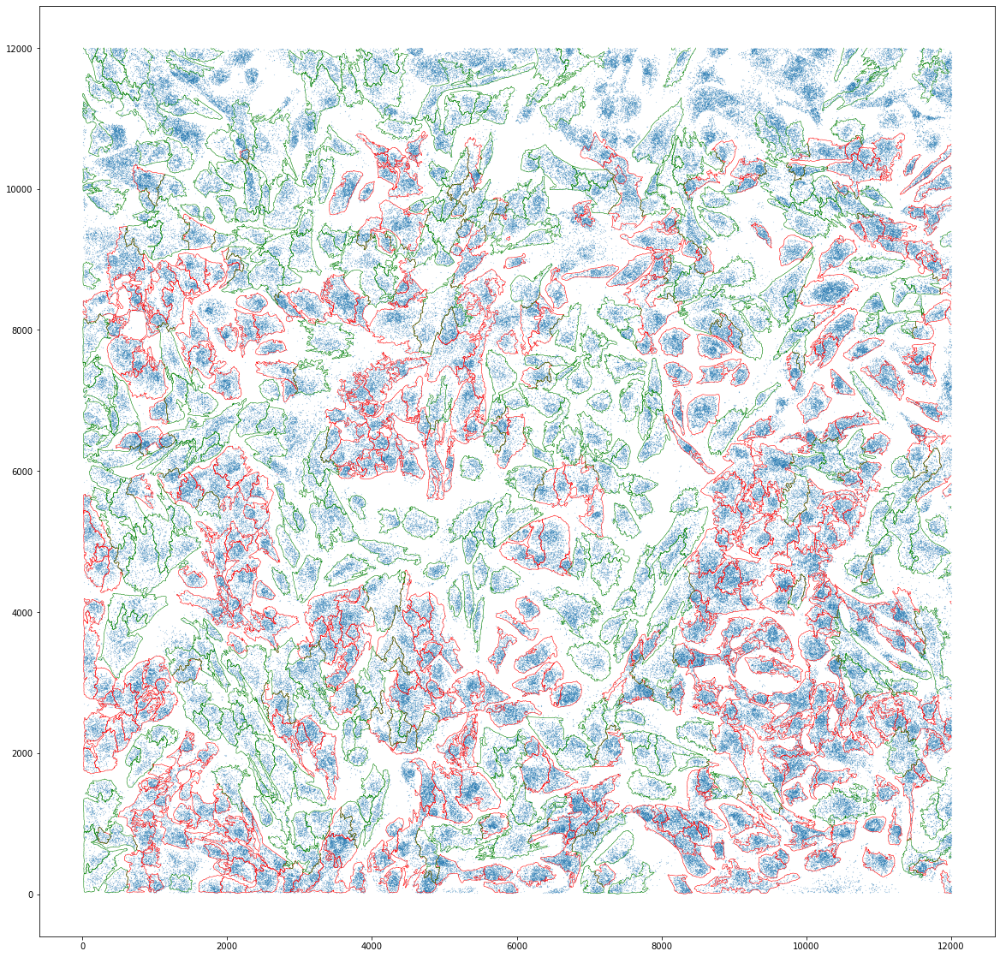

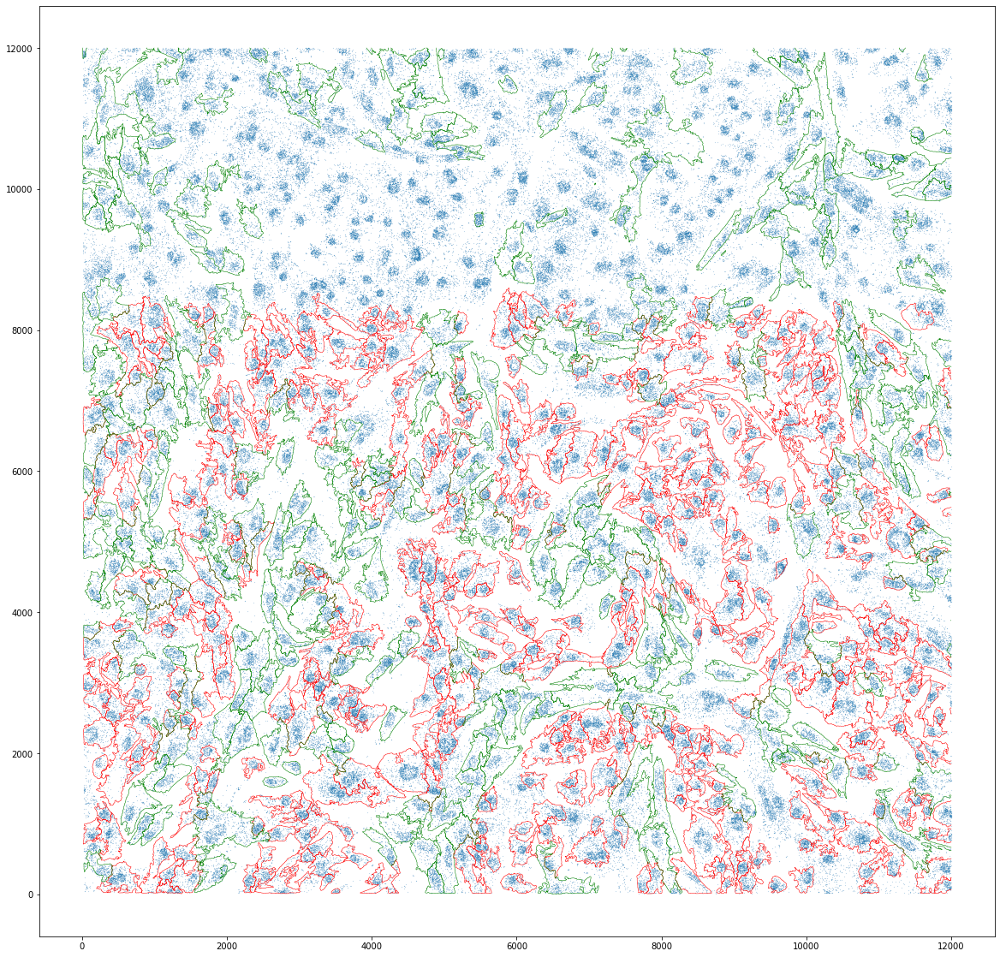

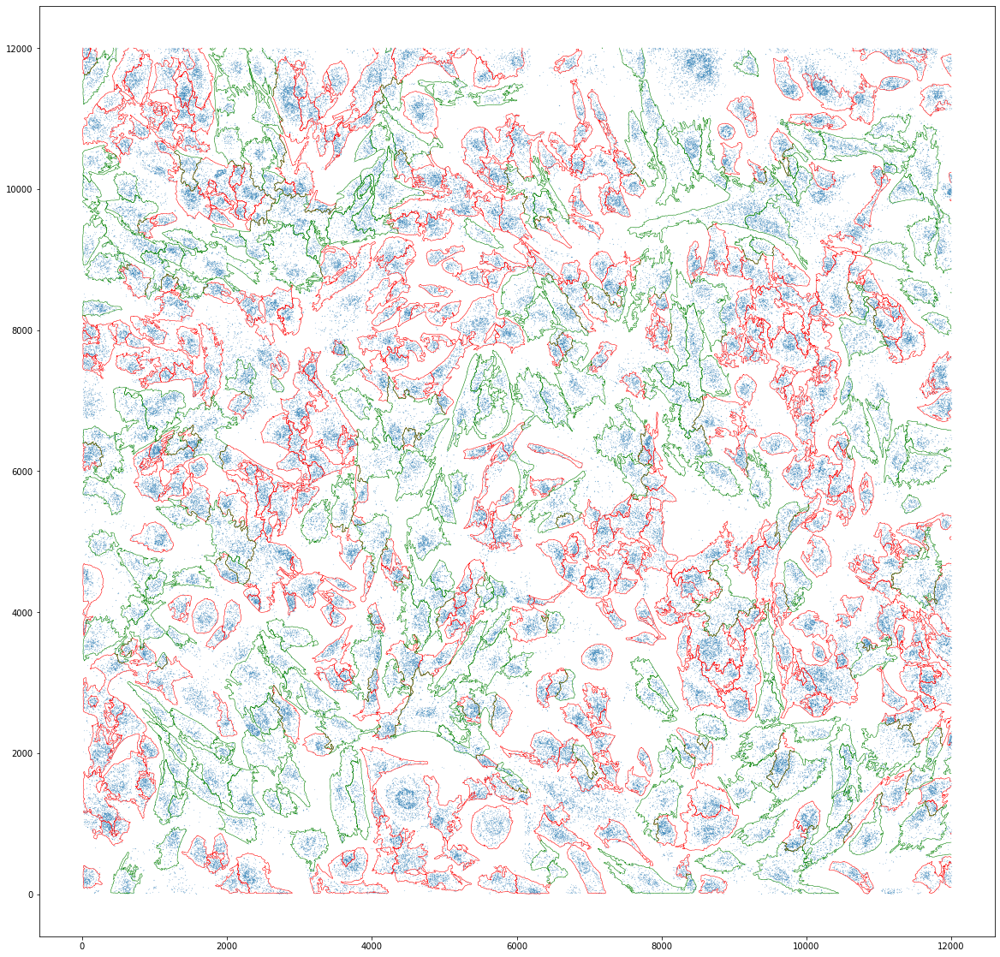

In [51]:
ub = 12000
for area in area_list[1:]:
    # reads -> project to 2D
    genes2seqs, seqs2genes = load_genes(ppath)
    mat_bases, mat_points = load_reads_3D(os.path.join(ppath, 'output', '2022-10-15-merged-points', f'Area_{area}'), 'merged_goodPoints.mat')
    points = mat_points.astype(int)
    bases = np.array([seqs2genes[x] for x in mat_bases])
    # segmentation
    cell_seg = imread(os.path.join(ppath, 'output', '2022-10-16-2D-segmentation', 'flamingo_backscaled', f'Area{area}_cell_2D.tif'))
    _cell_type = cell_type[cell_type['sample']==area2sample[area]]
    cardiac = _cell_type[_cell_type['seurat_clusters']==0]['orig_index']+1
    fibroblast = _cell_type[_cell_type['seurat_clusters']==1]['orig_index']+1
    _cell_seg = cell_seg[:ub, :ub]    
    contour_cardiac = []
    for i in tqdm(cardiac[:500]):
        ct = find_contours(_cell_seg==i)
        if len(ct):
            contour_cardiac.append(ct[0])
    contour_fibroblast = []
    for i in tqdm(fibroblast[:500]):
        ct = find_contours(_cell_seg==i)
        if len(ct):
            contour_fibroblast.append(ct[0])
    _points = points[np.logical_and(points[:,1]<ub, points[:,2]<ub)]
    plt.figure(figsize=(20,20))
    plt.scatter(_points[:,2], _points[:,1], s=0.01)
    for ct_cardiac in contour_cardiac:
        plt.plot(ct_cardiac[:,1], ct_cardiac[:,0], linewidth=0.5, c='red')
    for ct_fibroblast in contour_fibroblast:
        plt.plot(ct_fibroblast[:,1], ct_fibroblast[:,0], linewidth=0.5, c='green')
    plt.savefig(f'Z:/Connie/02.TEMPOmap/02.revisionCardiomyocyte64Gene/output/figures/cell_contour_{area2sample[area]}.pdf')